# Cycle GAN Practice Project - Horses and Zebras - Image Regeneration

In [1]:
# !pip install 'keras<3.0.0' mediapipe-model-maker
!pip install tensorflow
!pip install tensorflow_addons
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras import layers, Model, Input
import tensorflow_addons as tfa
import matplotlib.pyplot as plt
from IPython.display import clear_output
import time

AUTOTUNE = tf.data.AUTOTUNE
print("Imported Successfully")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 54.4 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 3.0.5
    Uninstalling keras-3.0.5:
      Successfully uninstalled keras-3.0.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.8.1 requires wurlitzer, which is not installed.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 28.0 MB/s eta 0:00:00
  Attempting uninstall: typeguard
    Found existing installation: typeguard 4.1.5
    Uninstalling typeguard-4.1.5:
      Successfully uninstalled typeguard-4.1.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ydata-profiling 4.6.4 requires numpy<1.26,>=1.16.0, but you have numpy 1.26.4 which is incompatible.
y

2024-04-01 11:17:27.156082: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-01 11:17:27.156212: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-01 11:17:27.261734: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Imported Successfully


/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


## Loading Dataset

In [2]:
device = '/gpu:0' if tf.test.is_gpu_available() else '/cpu:0'


dataset = tfds.load('cycle_gan/horse2zebra', as_supervised = True)

train_horses_dataset = dataset['trainA']
train_zebras_dataset = dataset['trainB']
test_horses_dataset = dataset['testA']
test_zebras_dataset = dataset['testB']


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/4 [00:00<?, ? splits/s]

Generating trainA examples...:   0%|          | 0/1067 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/horse2zebra/3.0.0.incompleteDD7580/cycle_gan-trainA.tfrecord*...…

Generating trainB examples...:   0%|          | 0/1334 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/horse2zebra/3.0.0.incompleteDD7580/cycle_gan-trainB.tfrecord*...…

Generating testA examples...:   0%|          | 0/120 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/horse2zebra/3.0.0.incompleteDD7580/cycle_gan-testA.tfrecord*...:…

Generating testB examples...:   0%|          | 0/140 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cycle_gan/horse2zebra/3.0.0.incompleteDD7580/cycle_gan-testB.tfrecord*...:…

Dataset cycle_gan downloaded and prepared to /root/tensorflow_datasets/cycle_gan/horse2zebra/3.0.0. Subsequent calls will reuse this data.


In [3]:
BUFFER_SIZE = 1000
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

## Preprocessing and Normalization

In [4]:

def pre_processing(image, label):
    image = tf.image.random_crop(image, size=[IMG_HEIGHT, IMG_WIDTH, 3])
    image = image = (tf.cast(image, tf.float32) - 127.5) / 127.5
    return image, label

In [5]:
# Apply preprocessing functions
train_horses_normalized = train_horses_dataset.map(pre_processing, num_parallel_calls= AUTOTUNE)
train_zebras_normalized = train_zebras_dataset.map(pre_processing, num_parallel_calls= AUTOTUNE)
test_horses_normalized = test_horses_dataset.map(pre_processing, num_parallel_calls= AUTOTUNE)
test_zebras_normalized = test_zebras_dataset.map(pre_processing, num_parallel_calls= AUTOTUNE)


# Shuffle
train_horses_shuffled = train_horses_normalized.shuffle(BUFFER_SIZE)
train_zebras_shuffled = train_zebras_normalized.shuffle(BUFFER_SIZE)
test_horses_shuffled = test_horses_normalized.shuffle(BUFFER_SIZE)
test_zebras_shuffled = test_zebras_normalized.shuffle(BUFFER_SIZE)


# Batch
train_horses_batch = train_horses_shuffled.batch(BATCH_SIZE)
train_zebras_batch = train_zebras_shuffled.batch(BATCH_SIZE)
test_horses_batch = test_horses_shuffled.batch(BATCH_SIZE)
test_zebras_batch = test_zebras_shuffled.batch(BATCH_SIZE)

## Visualisation

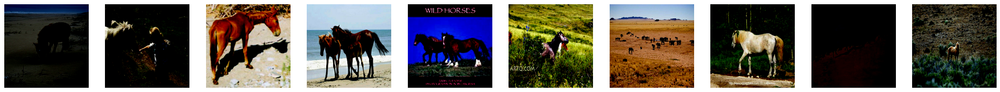

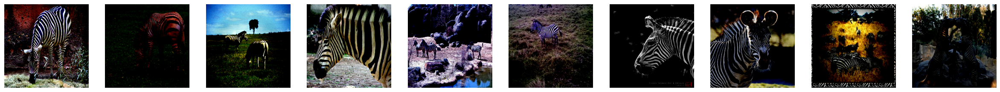

In [7]:
def plot_images(dataset, num_images):
    fig, axes = plt.subplots(1, num_images, figsize=(num_images * 3, 3))
    for i, (image, _) in enumerate(dataset.take(num_images)):
        axes[i].imshow(image)
        axes[i].axis('off')
    plt.show()

plot_images(train_horses_normalized,10)
plot_images(train_zebras_normalized,10)


# The architecture
### Generators: 2
### Discriminators: 2

# Sampling 

Before we even get to the architectures of the models, we need to worry about the sampling, we need to make sure that the images are being  interpreted by the neural networks correctly, what I mean by this is, that we need to implement some sort of sampling functions that do the following:

1. Compresses images to extract essential features lets call this the downsmapling function.
2. Reconstructs these images from features into the target domain, enabling unpaired image-to-image translation, lets call this the upsampling function

both of these funciton will be used in our neural networks, they have been implemented below.

In [8]:
def downsample(filters, size, apply_norm=True, norm_type='instancenorm'):

    # Initializing the weights  
    initializer = tf.random_normal_initializer(mean=0.005, stddev=0.005)
    result = tf.keras.Sequential()
    result.add(layers.Conv2D(filters, size, strides= 2, padding='same', kernel_initializer=initializer, use_bias=False))

    # Conditionally applying normalization
    if apply_norm:
        if norm_type == 'instancenorm':  # Check if normalization type is instance normalization
            result.add(tfa.layers.InstanceNormalization())
    
    # Adding ReLU for non-linearity while allowing some gradients to flow for negative values        
    result.add(layers.ReLU())
    return result


def upsample(filters, size, apply_dropout=False):

    # Initializing the weights  
    initializer = tf.random_normal_initializer(mean=0.005, stddev=0.005)
    result = tf.keras.Sequential()
    result.add(layers.Conv2DTranspose(filters, size, strides=2, padding='same', kernel_initializer=initializer, use_bias=False))
    result.add(tfa.layers.InstanceNormalization())

    # Conditionally applying dropout for regularization
    if apply_dropout:
        result.add(layers.Dropout(0.5))

    # Adding ReLU for non-linearity to ensure positive activations
    result.add(layers.ReLU())
    return result


# Generator Architecture

We will be implementing the generator architecture of U-Net, which is a popular architecture for image-to-image translation tasks. The architecture is as follows:

1. Downsampling: The generator first downsamples the input image and extracts features from it.
2. Bottleneck: The features are then passed through a bottleneck layer.
3. Upsampling: The features are then upsampled to generate the output image.


In [9]:
def unet_generator(output_channels, norm_type='instancenorm'):

    # Defining the input layer
    inputs = Input(shape=[None, None, 3])

    # Constructing the downsampling stack 
    down_stack = [
        downsample(64, 4, apply_norm=False), # Starting without normalization for the first layer
        downsample(128, 4, norm_type),
        downsample(256, 4, norm_type),
        downsample(256, 4 ,norm_type),
        downsample(512, 4, apply_norm=False), # Ending without normalization for the last layer
    ]

    # Constructing the upsampling stack  
    up_stack = [
        upsample(512, 4, apply_dropout=True), # Starting with dropout layers for regularization
        upsample(256,4,),
        upsample(256,4,),
        upsample(128,4,),
        upsample(64,4, apply_dropout=True), # Ending with dropout layers for regularization
    ]

    # Defining the final layer with a Conv2DTranspose to map to the desired output_channels with 'tanh' activation
    initializer = tf.random_normal_initializer(mean=0.005, stddev=0.005) # Initializing with the same mean and std dev we used above
    last = layers.Conv2DTranspose(output_channels, 4, strides=2, padding='same', kernel_initializer=initializer, activation='tanh')

    # Implementing the forward pass: downsampling, skip connections, and upsampling
    # Applying down_stack layers to inputs
    outputs = inputs
    skips = []
    for down in down_stack:
        outputs = down(outputs)
        skips.append(outputs)
    
    skips = reversed(skips[:-1])
    for up, skip in zip(up_stack, skips):
        outputs = up(outputs)
        outputs = layers.Concatenate()([outputs, skip])
    
    outputs = last(outputs)
    
    return Model(inputs=inputs, outputs= outputs) 

# Discriminator Architecture

The discriminator architecture is a PatchGAN discriminator, which is a popular discriminator architecture for image-to-image translation tasks. The architecture is as follows:

1. The discriminator downsamples the input image and extracts features from it.
2. The features are then passed through a bottleneck layer.
3. The features are then passed through a classification layer.



In [10]:
def discriminator(norm_type='instancenorm', target=False):
    # Defining the input layer and initializing the weights
    initializer = tf.random_normal_initializer(mean=0.005,stddev=0.005) # Initializing with the same mean and std dev we used above
    inp = Input(shape=[None, None, 3], name='input_image')

    x = inp

    # Optionally concatenating target image if discriminator is conditional
    if target:
        tar = Input(shape=[None, None, 3], name='target_image')
        x = layers.concatenate([inp, tar])  # Combining input and target for conditional GAN

    # Adding downsampling layers to process the input (or combined input and target) images
    x = downsample(64, 4, False, norm_type)(x)  # Starting with downsampling without normalization
    x = downsample(128, 4, True, norm_type)(x)  # Subsequent layers with normalization
    x = downsample(256, 4, True, norm_type)(x)


    # Applying convolution with zero padding -> Conv2d -> normalization layers to refine the features before the final layer
    zero_pad1 = layers.ZeroPadding2D()(x)
    conv = layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero_pad1)

    if norm_type == 'instancenorm':
        norm1 =  tfa.layers.InstanceNormalization()(conv)
        leaky_relu = layers.LeakyReLU()(norm1)


    # Adding a final convolution layer without normalization
        
    zero_pad2 = layers.ZeroPadding2D()(leaky_relu)
    last = layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2)

    # Returning model based on whether target image is part of the input
    if target:
        return Model(inputs=[inp, tar], outputs=last)
    else:
        return Model(inputs=inp, outputs=last)


In [11]:
OUTPUT_CHANNELS = 3  # RGB

# declaring the generators
generator_g = unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

# declaring the discriminators
discriminator_x = discriminator(norm_type='instancenorm', target=False)
discriminator_y = discriminator(norm_type='instancenorm', target=False)


# Visualizing the latent space representation
To see if the model is doing any kind of transformation

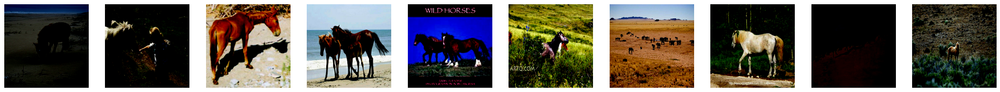

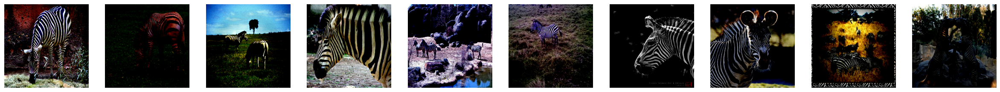

In [12]:
plot_images(train_horses_normalized,10)
plot_images(train_zebras_normalized,10)

## Loss functions

In CycleGAN, there is no paired data to train on, hence there is no guarantee that the input and the target  pair are meaningful during training. Thus in order to enforce that the network learns the correct mapping, the authors propose the cycle consistency loss.

We are going to have to implement the following loss functions:

1. Discriminator loss
2. Generator loss
3. Identity loss
4. Cycle consistency loss

In [13]:
# This line initializes a loss_obj object as an instance of TensorFlow's BinaryCrossentropy class, configured to operate on logits.
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [14]:
def discriminator_loss(real, generated):
  real_loss = loss_obj(tf.ones_like(real), real)
  generated_loss = loss_obj(tf.zeros_like(generated), generated)
  total_disc_loss = real_loss + generated_loss

  return total_disc_loss * 0.5

In [15]:
def generator_loss(generated):
  return loss_obj(tf.zeros_like(generated), generated)

In [16]:
def calc_cycle_loss(real_image, cycled_image):
  loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
  final_loss = 10 * loss1
  return final_loss

In [17]:
def identity_loss(real_image, same_image):
  loss2 = tf.reduce_mean(tf.abs(real_image - same_image))
  final_loss2 = 5 * loss2
  return final_loss2

Initializing the optimizers for all the generators and the discriminators. 

we will be using the good old adam optimizer, with the betas set to what they are right now.

In [18]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

## Training the model

Now that we are done with the model and everything else, lets train the model.

In most computationally restricted implementations, the model is trained for 5 to 10 epochs, and does show some signs of image translation. but this also depends on your architecture.

In [19]:
EPOCHS = 10

In [20]:
def generate_images(model, test_input):
    prediction = model(test_input, training=False)
    plt.figure(figsize=(12, 12))

    plt.subplot(1, 2, 1)
    plt.title('Input Image')
    plt.imshow(test_input[0] * 0.5 + 0.5)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title('Generated Image')
    plt.imshow(prediction[0] * 0.5 + 0.5)
    plt.axis('off')

    plt.show()

The training loop consists of four main steps:

* Get the predictions (essentially a forward pass).
* Calculate the loss.
* Calculate the gradients using backpropagation.
* Apply the gradients to the optimizer.

In [21]:
@tf.function
def train_step(real_x, real_y):
  
  with tf.GradientTape(persistent=True) as tape:
    
    fake_y = generator_g(real_x, training=True)
    cycled_x = generator_f(fake_y, training=True)

    fake_x = generator_f(real_y, training=True)
    cycled_y = generator_g(fake_x, training=True)
    
    same_x = generator_f(real_x, training=True)
    same_y = generator_g(real_y, training=True)

    disc_real_x = discriminator_x(real_x, training=True)
    disc_real_y = discriminator_y(real_y, training=True)

    disc_fake_x = discriminator_x(fake_x, training=True)
    disc_fake_y = discriminator_y(fake_y, training=True)

    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)

    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)
    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))

    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))
    
    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_variables)
    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))

    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_variables)
    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))
    return gen_g_loss, gen_f_loss, total_cycle_loss, disc_x_loss, disc_y_loss

In [22]:
EPOCHS = 10

In [23]:
for epoch in range(EPOCHS):
    generator_loss_x_total = 0.0
    generator_loss_y_total = 0.0
    cycle_loss_total = 0.0
    discriminator_loss_x_total = 0.0
    discriminator_loss_y_total = 0.0
    
    for zebra_images, horse_images in tf.data.Dataset.zip((train_zebras_batch, train_horses_batch)):
        generator_loss_x, generator_loss_y, cycle_loss, discriminator_loss_x, discriminator_loss_y = train_step(horse_images[0], zebra_images[0])
        
        cycle_loss_total += cycle_loss
        discriminator_loss_y_total += discriminator_loss_y
        discriminator_loss_x_total += discriminator_loss_x
        generator_loss_y_total += generator_loss_y
        generator_loss_x_total += generator_loss_x
        
    
    generator_loss_y_avg = generator_loss_y_total / len(train_horses_batch)
    generator_loss_x_avg = generator_loss_x_total / len(train_zebras_batch)
    discriminator_loss_x_avg = discriminator_loss_x_total / len(train_zebras_batch)
    cycle_loss_avg = cycle_loss_total / len(train_zebras_batch)
    discriminator_loss_y_avg = discriminator_loss_y_total / len(train_horses_batch)     
        
    print(f"Epoch {epoch+1}")
    print(f"  Generator X Loss: {generator_loss_x_avg}")
    print(f"  Generator Y Loss: {generator_loss_y_avg}")
    print(f"  Cycle Loss Total: {cycle_loss_avg}")
    print(f"  Discriminator X Loss: {discriminator_loss_x_avg}")
    print(f"  Discriminator Y Loss: {discriminator_loss_y_avg}")


2024-04-01 00:12:54.567600: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/sequential_5/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
I0000 00:00:1711930380.235670     101 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Epoch 1
  Generator X Loss: 0.6794431805610657
  Generator Y Loss: 0.8715879321098328
  Cycle Loss Total: 3.9136452674865723
  Discriminator X Loss: 0.6323400735855103
  Discriminator Y Loss: 0.7946454882621765
Epoch 2
  Generator X Loss: 0.06941408663988113
  Generator Y Loss: 0.19253498315811157
  Cycle Loss Total: 2.578763961791992
  Discriminator X Loss: 0.15245147049427032
  Discriminator Y Loss: 0.07789382338523865
Epoch 3
  Generator X Loss: 0.010301225818693638
  Generator Y Loss: 0.008085512556135654
  Cycle Loss Total: 1.7258968353271484
  Discriminator X Loss: 0.007184318266808987
  Discriminator Y Loss: 0.020215759053826332
Epoch 4
  Generator X Loss: 0.014285925775766373
  Generator Y Loss: 0.0033313767053186893
  Cycle Loss Total: 1.4517481327056885
  Discriminator X Loss: 0.002349749207496643
  Discriminator Y Loss: 0.017763424664735794
Epoch 5
  Generator X Loss: 0.004258594010025263
  Generator Y Loss: 0.0010859647300094366
  Cycle Loss Total: 1.2972612380981445
  Disc

## Generation time


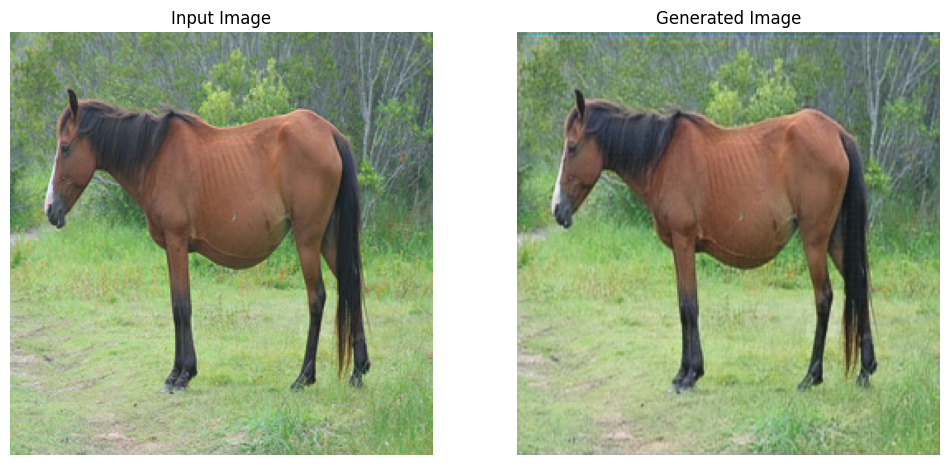

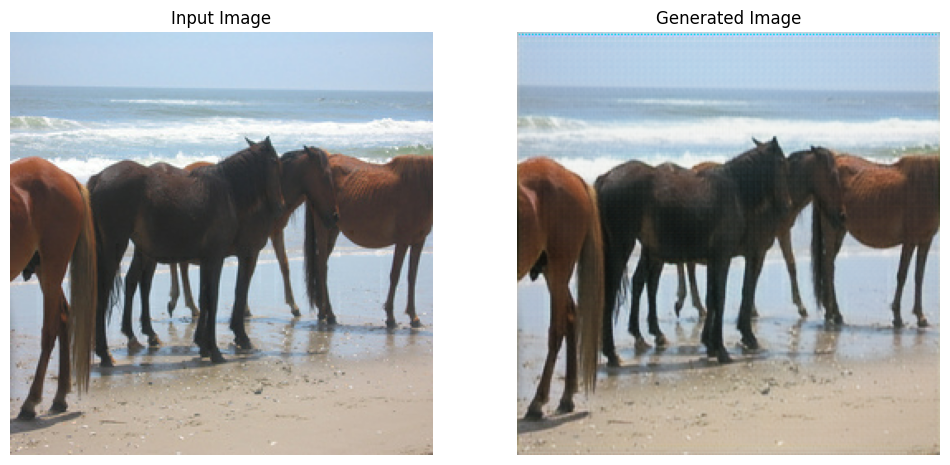

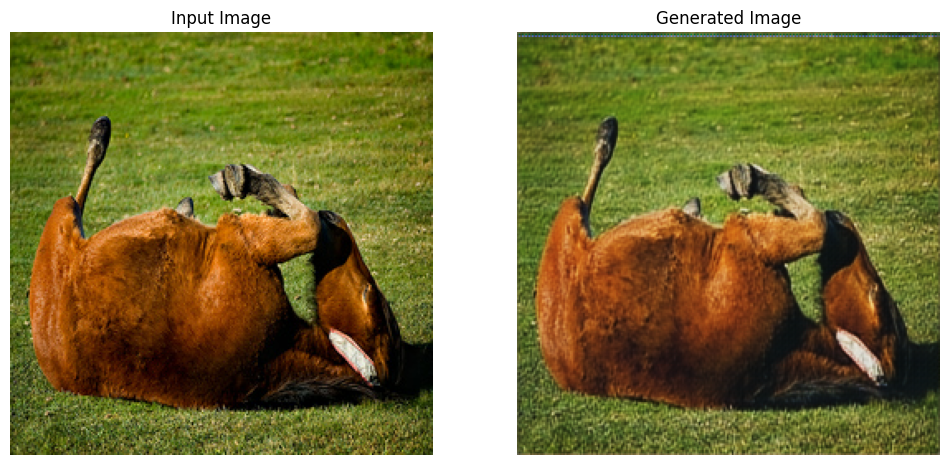

In [32]:
test_dataset = tf.data.Dataset.zip((test_horses_batch, test_zebras_batch))
data_iter = iter(test_dataset)
for i in range(3):
    generate_images(generator_g, next(data_iter)[0][0])

# Some Interesting Observations

What would happen if we were to reduce the size of the dataset to 1/4 the number of images, and then train the GAN, how would the results differ, we can do the following:

1. Train the GAN with the 1/4 the dataset
2. Run the epochs till 10.
3. Generate images using this newly trained model

In [28]:
# Load Data
dataset = tfds.load('cycle_gan/horse2zebra', as_supervised = True)

train_horses_dataset = dataset['trainA']
train_zebras_dataset = dataset['trainB']
test_horses_dataset = dataset['testA']
test_zebras_dataset = dataset['testB']

# Divide dataset into 1/4
train_horses_dataset = train_horses_dataset.take(len(train_horses_dataset) // 4)
train_zebras_dataset = train_zebras_dataset.take(len(train_zebras_dataset) // 4)

# Normalized and Cropped
train_horses_normalized = train_horses_dataset.map(pre_processing, num_parallel_calls= AUTOTUNE)
train_zebras_normalized = train_zebras_dataset.map(pre_processing, num_parallel_calls= AUTOTUNE)
test_horses_normalized = test_horses_dataset.map(pre_processing, num_parallel_calls= AUTOTUNE)
test_zebras_normalized = test_zebras_dataset.map(pre_processing, num_parallel_calls= AUTOTUNE)

# Shuffle
train_horses_shuffled = train_horses_normalized.shuffle(BUFFER_SIZE)
train_zebras_shuffled = train_zebras_normalized.shuffle(BUFFER_SIZE)
test_horses_shuffled = test_horses_normalized.shuffle(BUFFER_SIZE)
test_zebras_shuffled = test_zebras_normalized.shuffle(BUFFER_SIZE)

# Batch
train_horses_batch = train_horses_shuffled.batch(BATCH_SIZE)
train_zebras_batch = train_zebras_shuffled.batch(BATCH_SIZE)
test_horses_batch = test_horses_shuffled.batch(BATCH_SIZE)
test_zebras_batch = test_zebras_shuffled.batch(BATCH_SIZE)

OUTPUT_CHANNELS = 3  

generator_g = unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = discriminator(norm_type='instancenorm', target=False)
discriminator_y = discriminator(norm_type='instancenorm', target=False)

generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [29]:
for epoch in range(EPOCHS):
    generator_loss_x_total = 0.0
    generator_loss_y_total = 0.0
    cycle_loss_total = 0.0
    discriminator_loss_x_total = 0.0
    discriminator_loss_y_total = 0.0
    
    for zebra_images, horse_images in tf.data.Dataset.zip((train_zebras_batch, train_horses_batch)):
        generator_loss_x, generator_loss_y, cycle_loss, discriminator_loss_x, discriminator_loss_y = train_step(horse_images[0], zebra_images[0])
        
        cycle_loss_total += cycle_loss
        discriminator_loss_y_total += discriminator_loss_y
        discriminator_loss_x_total += discriminator_loss_x
        generator_loss_y_total += generator_loss_y
        generator_loss_x_total += generator_loss_x
        
    
    generator_loss_y_avg = generator_loss_y_total / len(train_horses_batch)
    generator_loss_x_avg = generator_loss_x_total / len(train_zebras_batch)
    discriminator_loss_x_avg = discriminator_loss_x_total / len(train_zebras_batch)
    cycle_loss_avg = cycle_loss_total / len(train_zebras_batch)
    discriminator_loss_y_avg = discriminator_loss_y_total / len(train_horses_batch)     
        
    print(f"Epoch {epoch+1}")
    print(f"  Generator X Loss: {generator_loss_x_avg}")
    print(f"  Generator Y Loss: {generator_loss_y_avg}")
    print(f"  Cycle Loss Total: {cycle_loss_avg}")
    print(f"  Discriminator X Loss: {discriminator_loss_x_avg}")
    print(f"  Discriminator Y Loss: {discriminator_loss_y_avg}")

2024-04-01 07:52:08.750186: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_4/sequential_31/dropout_4/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
I0000 00:00:1711957934.482115     101 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Epoch 1
  Generator X Loss: 1.0870190858840942
  Generator Y Loss: 1.3554792404174805
  Cycle Loss Total: 5.15285587310791
  Discriminator X Loss: 0.8726017475128174
  Discriminator Y Loss: 1.0981289148330688
Epoch 2
  Generator X Loss: 0.5513595342636108
  Generator Y Loss: 0.7027800679206848
  Cycle Loss Total: 4.042611122131348
  Discriminator X Loss: 0.5576565861701965
  Discriminator Y Loss: 0.6991182565689087
Epoch 3
  Generator X Loss: 0.550506591796875
  Generator Y Loss: 0.7028551697731018
  Cycle Loss Total: 3.5731711387634277
  Discriminator X Loss: 0.5568619966506958
  Discriminator Y Loss: 0.6986761093139648
Epoch 4
  Generator X Loss: 0.4323825240135193
  Generator Y Loss: 0.6843698620796204
  Cycle Loss Total: 3.3623836040496826
  Discriminator X Loss: 0.5444959998130798
  Discriminator Y Loss: 0.5273196697235107
Epoch 5
  Generator X Loss: 0.052259352058172226
  Generator Y Loss: 0.22103175520896912
  Cycle Loss Total: 3.238583564758301
  Discriminator X Loss: 0.1621840

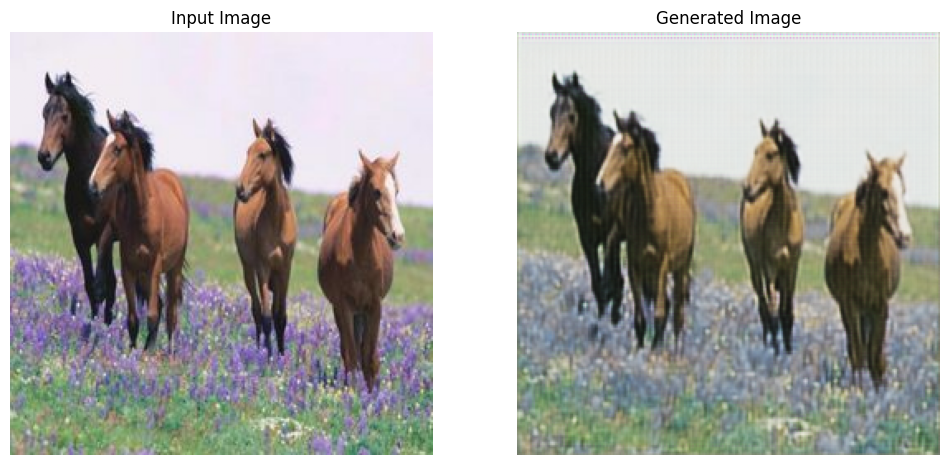

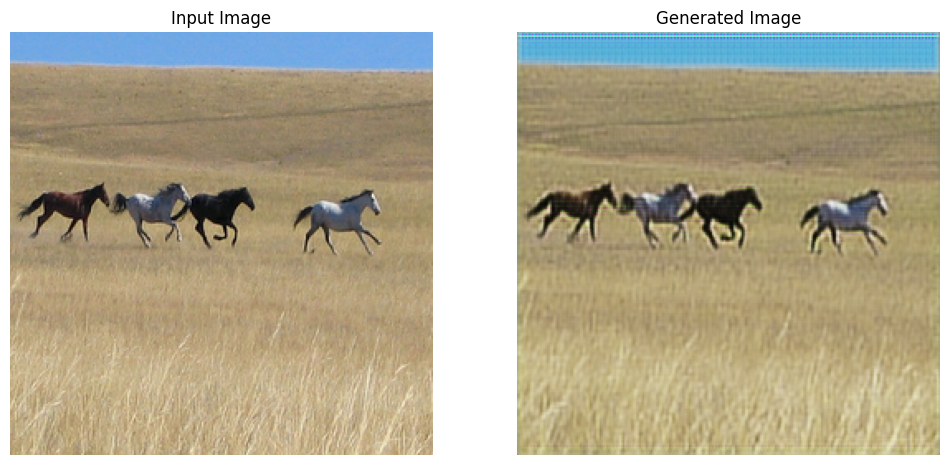

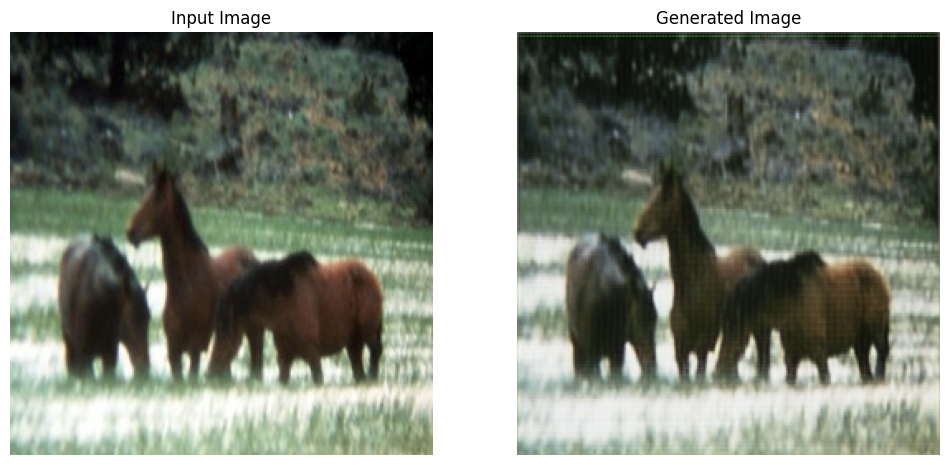

In [30]:
test_dataset = tf.data.Dataset.zip((test_horses_batch, test_zebras_batch))
data_iter = iter(test_dataset)
for i in range(3):
    generate_images(generator_g, next(data_iter)[0][0])

Observations reveal that the generator endeavored to manipulate the input image, inducing changes in the horse's body pattern and coloration. However, the quality of the generated output is notably inferior compared to previous iterations. In some cases, faint patterns emerge, albeit inconsistently. The decrease in dataset size restricts the diversity of horses and zebras available for model training. Consequently, the model encounters challenges in generalization, yielding less satisfactory generated images.

What would happen if we were to change the loss_obj object which is currently an instance of TensorFlow's BinaryCrossentropy class, and then train the GAN, how would the results differ we can do the following:

1. Train the GAN with the 1/4 the dataset.
2. chnage the BCE loss to somehting other relevant loss.
3. run till 10 epochs.
4. Generate images using this newly trained model

In [58]:
# Load Data
dataset = tfds.load('cycle_gan/horse2zebra', as_supervised = True)

train_horses_dataset = dataset['trainA']
train_zebras_dataset = dataset['trainB']
test_horses_dataset = dataset['testA']
test_zebras_dataset = dataset['testB']

# Divide dataset into 1/4
train_horses_dataset = train_horses_dataset.take(len(train_horses_dataset) // 4)
train_zebras_dataset = train_zebras_dataset.take(len(train_zebras_dataset) // 4)

# Normalized and Cropped
train_horses_normalized = train_horses_dataset.map(pre_processing, num_parallel_calls= AUTOTUNE)
train_zebras_normalized = train_zebras_dataset.map(pre_processing, num_parallel_calls= AUTOTUNE)
test_horses_normalized = test_horses_dataset.map(pre_processing, num_parallel_calls= AUTOTUNE)
test_zebras_normalized = test_zebras_dataset.map(pre_processing, num_parallel_calls= AUTOTUNE)

# Shuffle
train_horses_shuffled = train_horses_normalized.shuffle(BUFFER_SIZE)
train_zebras_shuffled = train_zebras_normalized.shuffle(BUFFER_SIZE)
test_horses_shuffled = test_horses_normalized.shuffle(BUFFER_SIZE)
test_zebras_shuffled = test_zebras_normalized.shuffle(BUFFER_SIZE)

# Batch
train_horses_batch = train_horses_shuffled.batch(BATCH_SIZE)
train_zebras_batch = train_zebras_shuffled.batch(BATCH_SIZE)
test_horses_batch = test_horses_shuffled.batch(BATCH_SIZE)
test_zebras_batch = test_zebras_shuffled.batch(BATCH_SIZE)

OUTPUT_CHANNELS = 3 

loss_obj = tf.losses.MeanSquaredError()

generator_g = unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = discriminator(norm_type='instancenorm', target=False)
discriminator_y = discriminator(norm_type='instancenorm', target=False)

generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

def discriminator_loss(real, generated):
  real_loss = loss_obj(tf.ones_like(real), real)
  generated_loss = loss_obj(tf.zeros_like(generated), generated)
  total_disc_loss = real_loss + generated_loss

  return total_disc_loss * 0.5

def generator_loss(generated):
  return loss_obj(tf.ones_like(generated), generated)

In [59]:
for epoch in range(EPOCHS):
    generator_loss_x_total = 0.0
    generator_loss_y_total = 0.0
    cycle_loss_total = 0.0
    discriminator_loss_x_total = 0.0
    discriminator_loss_y_total = 0.0
    
    for zebra_images, horse_images in tf.data.Dataset.zip((train_zebras_batch, train_horses_batch)):
        generator_loss_x, generator_loss_y, cycle_loss, discriminator_loss_x, discriminator_loss_y = train_step(horse_images[0], zebra_images[0])
        
        cycle_loss_total += cycle_loss
        discriminator_loss_y_total += discriminator_loss_y
        discriminator_loss_x_total += discriminator_loss_x
        generator_loss_y_total += generator_loss_y
        generator_loss_x_total += generator_loss_x
        
    
    generator_loss_y_avg = generator_loss_y_total / len(train_horses_batch)
    generator_loss_x_avg = generator_loss_x_total / len(train_zebras_batch)
    discriminator_loss_x_avg = discriminator_loss_x_total / len(train_zebras_batch)
    cycle_loss_avg = cycle_loss_total / len(train_zebras_batch)
    discriminator_loss_y_avg = discriminator_loss_y_total / len(train_horses_batch)     
        
    print(f"Epoch {epoch+1}")
    print(f"  Generator X Loss: {generator_loss_x_avg}")
    print(f"  Generator Y Loss: {generator_loss_y_avg}")
    print(f"  Cycle Loss Total: {cycle_loss_avg}")
    print(f"  Discriminator X Loss: {discriminator_loss_x_avg}")
    print(f"  Discriminator Y Loss: {discriminator_loss_y_avg}")

2024-04-01 08:17:46.726687: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_20/sequential_135/dropout_20/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Epoch 1
  Generator X Loss: 36.84135437011719
  Generator Y Loss: 45.26485061645508
  Cycle Loss Total: 6.882550239562988
  Discriminator X Loss: 34.99925994873047
  Discriminator Y Loss: 45.90738296508789
Epoch 2
  Generator X Loss: 0.3692677915096283
  Generator Y Loss: 0.6038855910301208
  Cycle Loss Total: 5.6097187995910645
  Discriminator X Loss: 0.29634252190589905
  Discriminator Y Loss: 0.3331546187400818
Epoch 3
  Generator X Loss: 0.2901434898376465
  Generator Y Loss: 0.4589194059371948
  Cycle Loss Total: 4.932590961456299
  Discriminator X Loss: 0.24234764277935028
  Discriminator Y Loss: 0.2940187156200409
Epoch 4
  Generator X Loss: 0.2654435932636261
  Generator Y Loss: 0.3458324670791626
  Cycle Loss Total: 4.652249813079834
  Discriminator X Loss: 0.22003139555454254
  Discriminator Y Loss: 0.2838200628757477
Epoch 5
  Generator X Loss: 0.26081958413124084
  Generator Y Loss: 0.32113155722618103
  Cycle Loss Total: 4.574635028839111
  Discriminator X Loss: 0.21516244

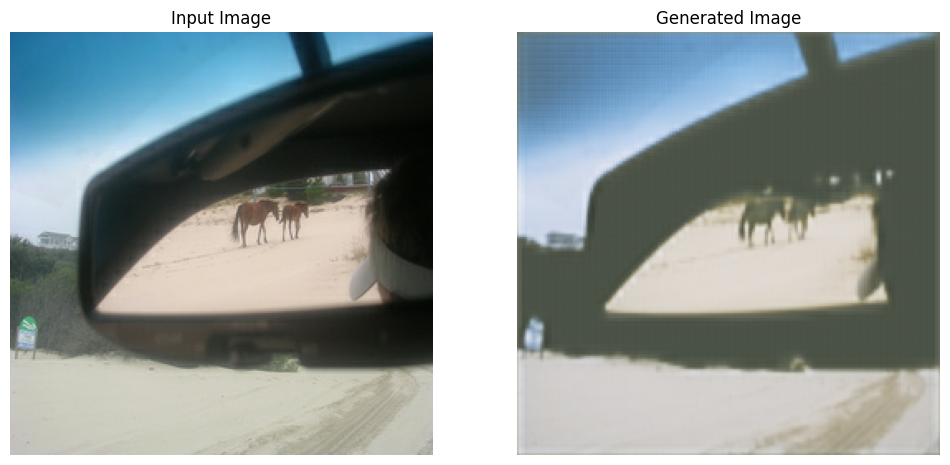

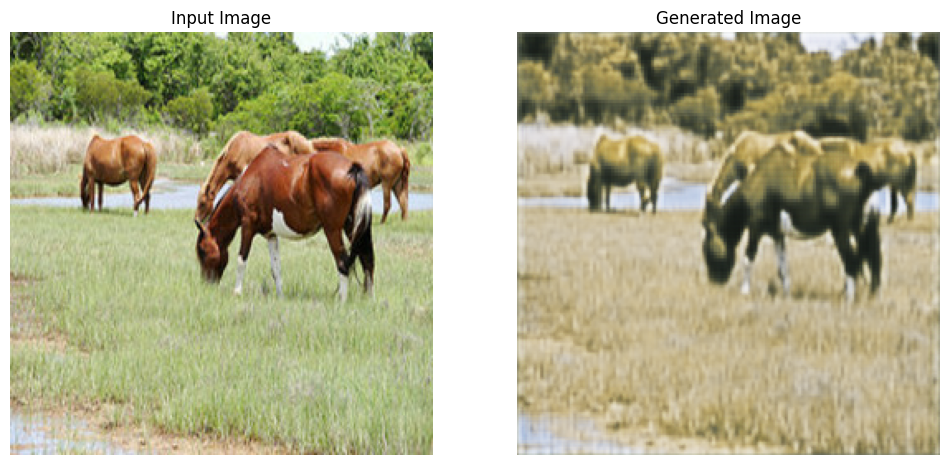

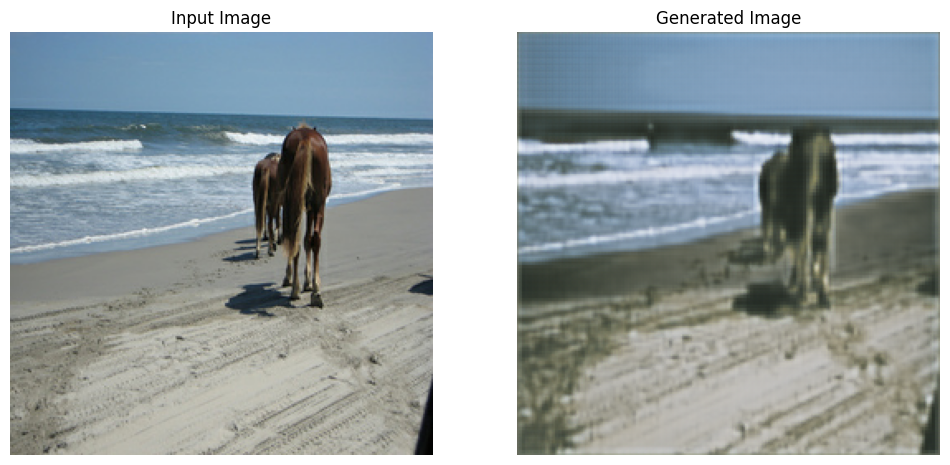

In [60]:
test_dataset = tf.data.Dataset.zip((test_horses_batch, test_zebras_batch))
data_iter = iter(test_dataset)
for i in range(3):
    generate_images(generator_g, next(data_iter)[0][0])

When mean squared error is employed, there is a noticeable decline in the quality of the generated images. Frequently, the images exhibit a greenish hue, giving them an unnatural appearance. This phenomenon occurs because mean squared error overly emphasizes precise pixel matching, occasionally altering the colors of objects within the images. As a result, the generated pictures appear distorted and have a significant green aspect.


What would happen if we were to add noise to the images of horses, add noise of coming from a random noise distribution to all horse images, and then train the GAN, how would the results differ we can do the following:

1. Take 1/4 the dataset, and add noise to the images of only horses.
2. Train the GAN with this 1/4 the dataset.
3. run till 10 epochs.
4. Generate images using this newly trained model.

In [23]:
# Load Data
dataset = tfds.load('cycle_gan/horse2zebra', as_supervised = True)

train_horses_dataset = dataset['trainA']
train_zebras_dataset = dataset['trainB']
test_horses_dataset = dataset['testA']
test_zebras_dataset = dataset['testB']

# Divide dataset into 1/4
train_horses_dataset = train_horses_dataset.take(len(train_horses_dataset) // 4)
train_zebras_dataset = train_zebras_dataset.take(len(train_zebras_dataset) // 4)

# Normalized and Cropped
train_horses_normalized = train_horses_dataset.map(pre_processing, num_parallel_calls= AUTOTUNE)
train_zebras_normalized = train_zebras_dataset.map(pre_processing, num_parallel_calls= AUTOTUNE)
test_horses_normalized = test_horses_dataset.map(pre_processing, num_parallel_calls= AUTOTUNE)
test_zebras_normalized = test_zebras_dataset.map(pre_processing, num_parallel_calls= AUTOTUNE)

# Shuffle
train_horses_shuffled = train_horses_normalized.shuffle(BUFFER_SIZE)
train_zebras_shuffled = train_zebras_normalized.shuffle(BUFFER_SIZE)
test_horses_shuffled = test_horses_normalized.shuffle(BUFFER_SIZE)
test_zebras_shuffled = test_zebras_normalized.shuffle(BUFFER_SIZE)

# Batch
train_horses_batch = train_horses_shuffled.batch(BATCH_SIZE)
train_zebras_batch = train_zebras_shuffled.batch(BATCH_SIZE)
test_horses_batch = test_horses_shuffled.batch(BATCH_SIZE)
test_zebras_batch = test_zebras_shuffled.batch(BATCH_SIZE)

OUTPUT_CHANNELS = 3 

loss_obj = tf.losses.BinaryCrossentropy(from_logits=True)

generator_g = unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = discriminator(norm_type='instancenorm', target=False)
discriminator_y = discriminator(norm_type='instancenorm', target=False)

generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

def discriminator_loss(real, generated):
  real_loss = loss_obj(tf.ones_like(real), real)
  generated_loss = loss_obj(tf.zeros_like(generated), generated)
  total_disc_loss = real_loss + generated_loss

  return total_disc_loss * 0.5

def generator_loss(generated):
  return loss_obj(tf.ones_like(generated), generated)

In [24]:
for epoch in range(EPOCHS):
    generator_loss_x_total = 0.0
    generator_loss_y_total = 0.0
    cycle_loss_total = 0.0
    discriminator_loss_x_total = 0.0
    discriminator_loss_y_total = 0.0
    
    for zebra_images, horse_images in tf.data.Dataset.zip((train_zebras_batch, train_horses_batch)):
        noisy_horse_images = horse_images[0] + tf.random.normal(tf.shape(horse_images[0]), mean= 0.01, stddev=0.01)
        noisy_horse_images = tf.clip_by_value(noisy_horse_images, -1, 1)
        generator_loss_x, generator_loss_y, cycle_loss, discriminator_loss_x, discriminator_loss_y = train_step(noisy_horse_images, zebra_images[0])
        
        cycle_loss_total += cycle_loss
        discriminator_loss_y_total += discriminator_loss_y
        discriminator_loss_x_total += discriminator_loss_x
        generator_loss_y_total += generator_loss_y
        generator_loss_x_total += generator_loss_x
        
    generator_loss_y_avg = generator_loss_y_total / len(train_horses_batch)
    generator_loss_x_avg = generator_loss_x_total / len(train_zebras_batch)
    discriminator_loss_x_avg = discriminator_loss_x_total / len(train_zebras_batch)
    cycle_loss_avg = cycle_loss_total / len(train_zebras_batch)
    discriminator_loss_y_avg = discriminator_loss_y_total / len(train_horses_batch)     
        
    print(f"Epoch {epoch+1}")
    print(f"  Generator X Loss: {generator_loss_x_avg}")
    print(f"  Generator Y Loss: {generator_loss_y_avg}")
    print(f"  Cycle Loss Total: {cycle_loss_avg}")
    print(f"  Discriminator X Loss: {discriminator_loss_x_avg}")
    print(f"  Discriminator Y Loss: {discriminator_loss_y_avg}")


2024-04-01 11:27:52.352415: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_4/sequential_31/dropout_4/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
I0000 00:00:1711970877.620232     100 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Epoch 1
  Generator X Loss: 0.6732924580574036
  Generator Y Loss: 0.8392645716667175
  Cycle Loss Total: 4.863800525665283
  Discriminator X Loss: 0.8796575665473938
  Discriminator Y Loss: 1.0817030668258667
Epoch 2
  Generator X Loss: 0.5748037695884705
  Generator Y Loss: 0.7055465579032898
  Cycle Loss Total: 3.744062900543213
  Discriminator X Loss: 0.5579915642738342
  Discriminator Y Loss: 0.6984933614730835
Epoch 3
  Generator X Loss: 0.581308126449585
  Generator Y Loss: 0.7000100612640381
  Cycle Loss Total: 3.3417491912841797
  Discriminator X Loss: 0.5578210949897766
  Discriminator Y Loss: 0.699658989906311
Epoch 4
  Generator X Loss: 0.5991116762161255
  Generator Y Loss: 0.7215377688407898
  Cycle Loss Total: 3.191049575805664
  Discriminator X Loss: 0.55290687084198
  Discriminator Y Loss: 0.698422372341156
Epoch 5
  Generator X Loss: 0.6077448129653931
  Generator Y Loss: 0.7831302881240845
  Cycle Loss Total: 3.025019645690918
  Discriminator X Loss: 0.54207003116607

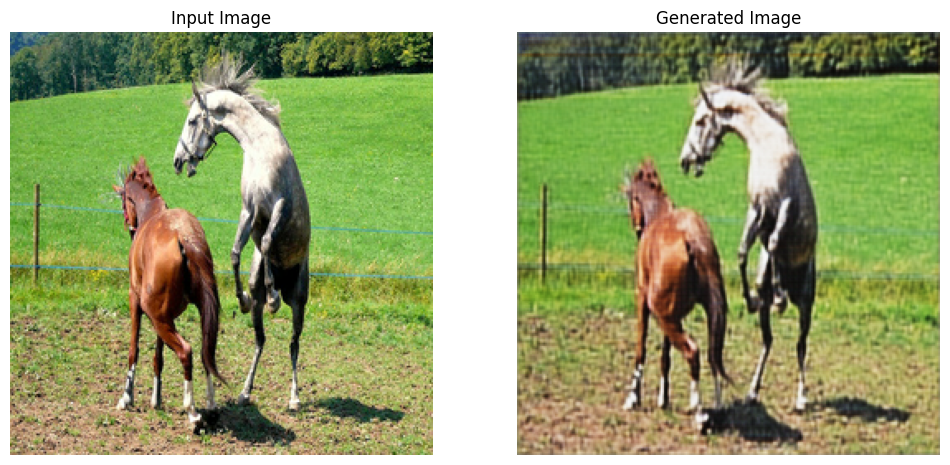

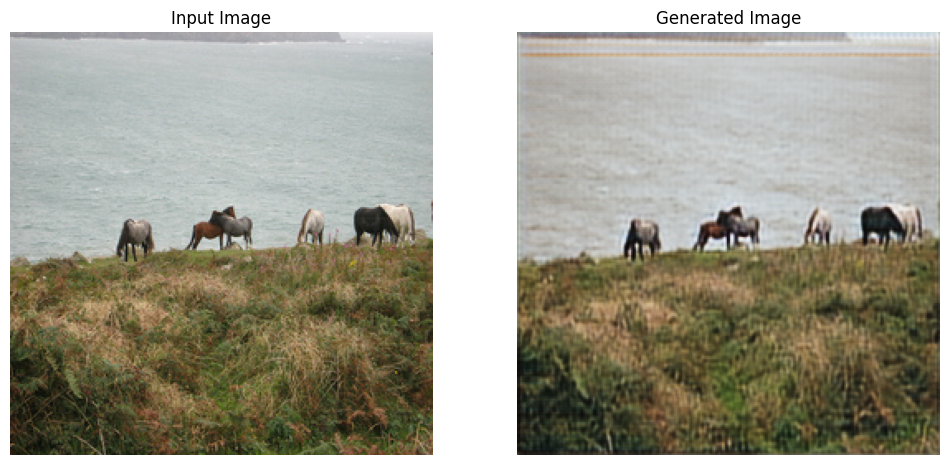

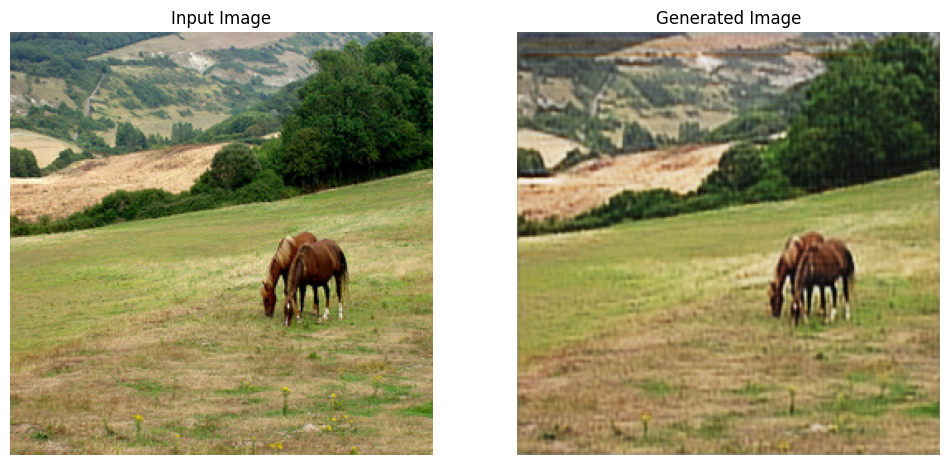

In [25]:
test_dataset = tf.data.Dataset.zip((test_horses_batch, test_zebras_batch))
data_iter = iter(test_dataset)
for i in range(3):
    generate_images(generator_g, next(data_iter)[0][0])

The images still retain some level of noise. Furthermore, when the model is trained using only a quarter of the available dataset, the quality of the generated images noticeably diminishes. This degradation occurs due to the model's limited exposure to examples during training, resulting in suboptimal learning. Consequently, despite its efforts, the model fails to produce images of comparable quality to those generated when trained on the complete dataset.
